# Visión por Computadora I - Trabajo Práctico 3
### Alumna: Noelia Qualindi | Cohorte 14 | Año 2024

Encontrar el logotipo de la gaseosa dentro de las imágenes provistas en Material_TPs/TP3/images a partir del template Material_TPs/TP3/template

1. (4 puntos) Obtener una detección del logo en cada imagen sin falsos positivos 
2. (4 puntos) Plantear y validar un algoritmo para múltiples detecciones en la imagen
coca_multi.png con el mismo témplate del ítem 1
3. (2 puntos) Generalizar el algoritmo del item 2 para todas las imágenes.

Visualizar los resultados con bounding boxes en cada imagen mostrando el nivel de confianza
de la detección.

In [60]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
%matplotlib inline

In [61]:
def load_template(template_path):
    template = cv.imread(template_path, cv.IMREAD_GRAYSCALE)
    return template

In [62]:
def load_images_from_folder(folder):
    images = []
    filenames = []
    for filename in os.listdir(folder):
        img = cv.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
            filenames.append(filename)
    return filenames, images

In [63]:
# Cargar el template del logo de Coca-Cola
# Ruta a la carpeta de imágenes y template
images_path = 'images'
template_path = 'template/pattern.png'
           
template = load_template(template_path)
filenames, images = load_images_from_folder(images_path)

#### Detección del logotipo usando pirámides gaussianas + Template Matching 

In [64]:
# Cargar el template
template = cv.imread(template_path, 0)
template_height, template_width = template.shape

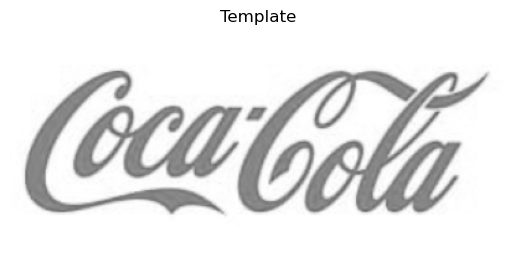

In [65]:
plt.title('Template')
plt.imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [89]:
def template_matching(image, template, method):
    result = cv.matchTemplate(image, template, method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
        confidence = 1 - min_val 
    else:
        top_left = max_loc
        confidence = max_val

    h, w = template.shape
    bbox = (top_left[0], top_left[1], w, h)
    return bbox, confidence

def detect_logo_with_methods(image, template, methods, scale_factors=[1.0, 0.75, 0.5, 0.25], confidence_threshold=0.8):
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

    if len(template.shape) == 3 and template.shape[2] == 3:
        template_gray = cv.cvtColor(template, cv.COLOR_BGR2GRAY)
    else:
        template_gray = template

    best_bbox = None
    best_confidence = -1
    best_method = None

    for method in methods:
        for scale in scale_factors:
            resized_image = cv.resize(gray_image, None, fx=scale, fy=scale, interpolation=cv.INTER_LINEAR)

            if resized_image.shape[0] < template_gray.shape[0] or resized_image.shape[1] < template_gray.shape[1]:
                continue

            pyr_image = resized_image.copy()
            while pyr_image.shape[0] >= template_gray.shape[0] and pyr_image.shape[1] >= template_gray.shape[1]:
                bbox, confidence = template_matching(pyr_image, template_gray, eval(method))
                if confidence >= confidence_threshold and confidence > best_confidence:
                    bbox = (int(bbox[0] / scale), int(bbox[1] / scale), bbox[2], bbox[3])
                    best_bbox = bbox
                    best_confidence = confidence
                    best_method = method

                pyr_image = cv.pyrDown(pyr_image)

    return best_bbox, best_confidence, best_method

def show_image_with_bbox(image, bbox, confidence, method_name):
    if bbox is not None:
        x, y, w, h = bbox
        cv.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv.putText(image, f"{method_name} - Confidence: {confidence:.2f}", (x, y - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

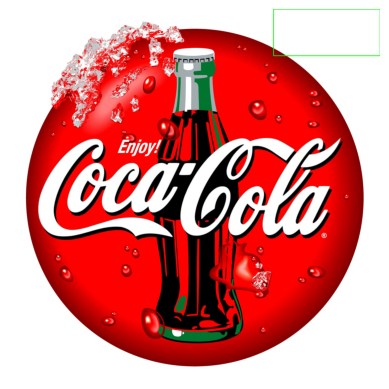

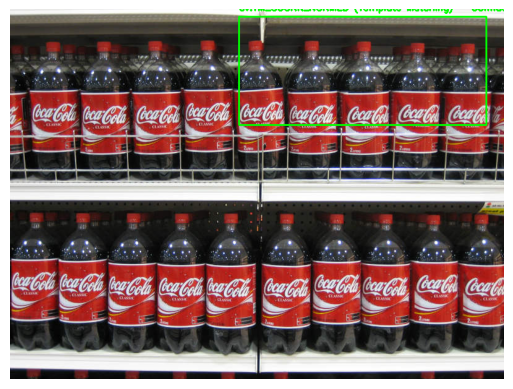

No se detectó el logo en la imagen: coca_logo_1.png para el método: cv.TM_CCORR_NORMED


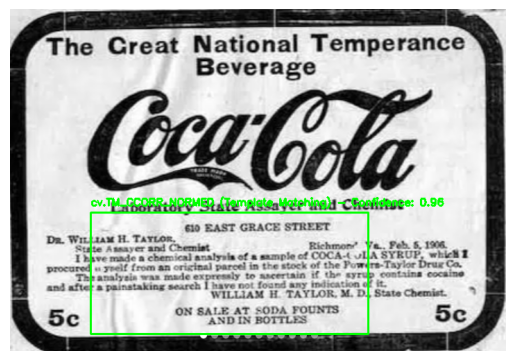

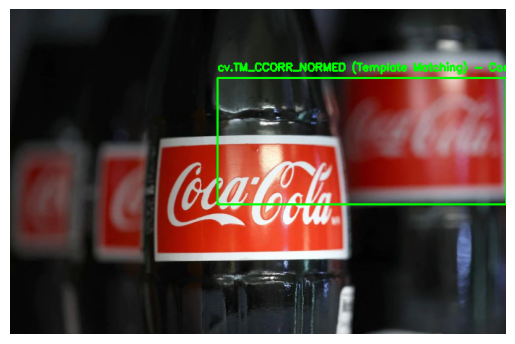

No se detectó el logo en la imagen: coca_logo_2.png para el método: cv.TM_CCORR_NORMED


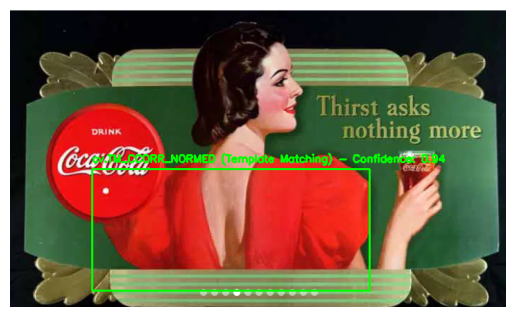

In [90]:
methods = ['cv.TM_CCORR_NORMED']
confidence_threshold = 0.8

for image_name in os.listdir(images_path):
    image_path = os.path.join(images_path, image_name)
    image = cv.imread(image_path)

    if image is None:
        print(f"Error al cargar la imagen: {image_path}")
        continue

    bbox, confidence, method_name = detect_logo_with_methods(image, template, methods, confidence_threshold=confidence_threshold)
    
    # muestra el resultado si se encontró una detección
    if bbox is not None:
        show_image_with_bbox(image, bbox, confidence, methods[0] + " (Template Matching)")
    else:
        print(f"No se detectó el logo en la imagen: {image_name} para el método: {methods[0]}")

#### Prueba de detecciones del logotipo usando pirámides gaussianas + SIFT + Template Matching 

In [91]:
def detect_multiple_logos_with_methods(image, template, methods, scale_factors=[1.0, 0.75, 0.5, 0.25], confidence_threshold=0.8):
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    all_results = {}

    for method in methods:
        method_name = method
        bboxes = []
        confidences = []

        for scale in scale_factors:
            resized_image = cv.resize(gray_image, None, fx=scale, fy=scale, interpolation=cv.INTER_LINEAR)

            # checkeo que la imagen redimensionada sea mayor o igual que el template
            if resized_image.shape[0] < template.shape[0] or resized_image.shape[1] < template.shape[1]:
                continue
            
            # pirámide gaussiana para generar diferentes escalas de la imagen
            pyr_image = resized_image.copy()
            while pyr_image.shape[0] >= template.shape[0] and pyr_image.shape[1] >= template.shape[1]:
                bbox, confidence = template_matching(pyr_image, template, eval(method))
                if confidence >= confidence_threshold:
                    # redimensiono el bounding box para que sea el mismo tamaño que la imagen original
                    bbox = (int(bbox[0] / scale), int(bbox[1] / scale), int(bbox[2] / scale), int(bbox[3] / scale))
                    bboxes.append(bbox)
                    confidences.append(confidence)

                pyr_image = cv.pyrDown(pyr_image)

        all_results[method_name] = (bboxes, confidences)

    return all_results

# mostrar imágenes con bounding boxes
def show_image_with_bboxes(image, bboxes, confidences, method_name):
    for bbox, confidence in zip(bboxes, confidences):
        x, y, w, h = bbox
        cv.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv.putText(image, f'{confidence:.2f}', (x, y - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    plt.title(method_name)
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

#### Caso para todas las imágenes

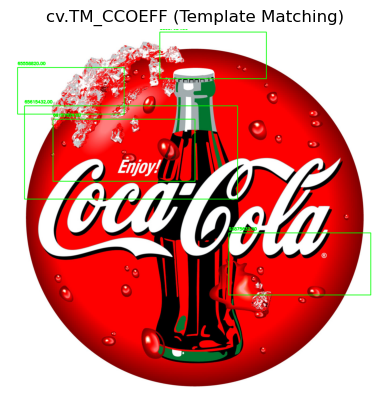

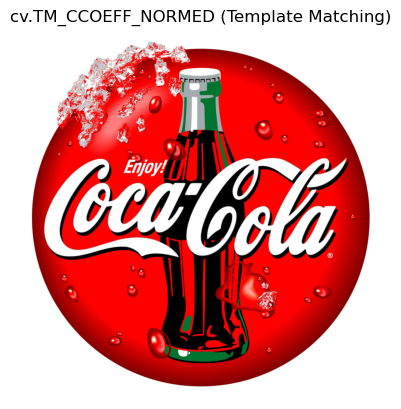

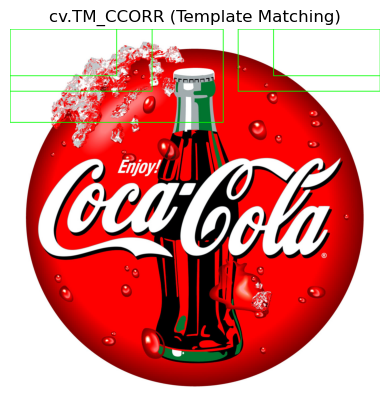

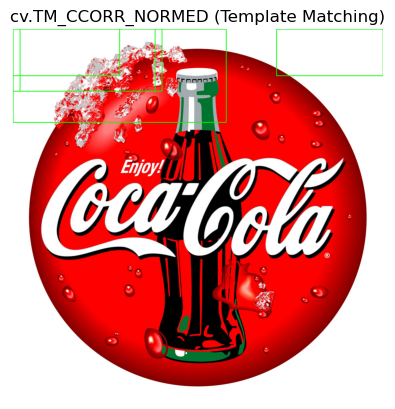

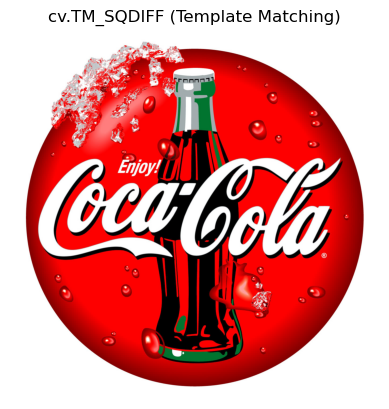

...

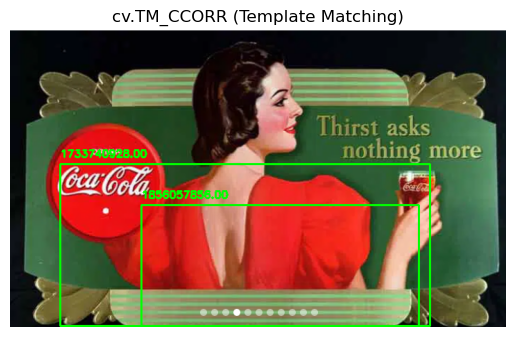

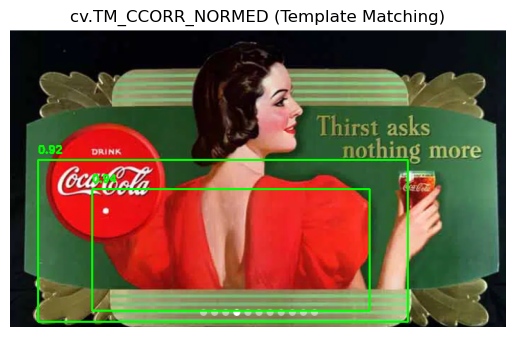

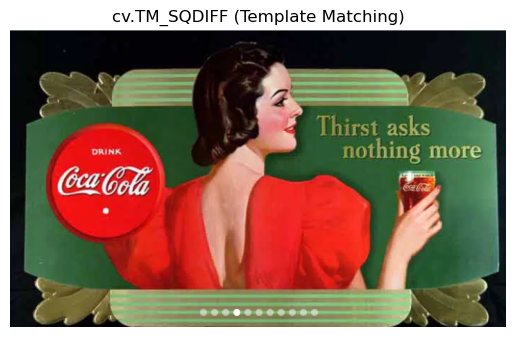

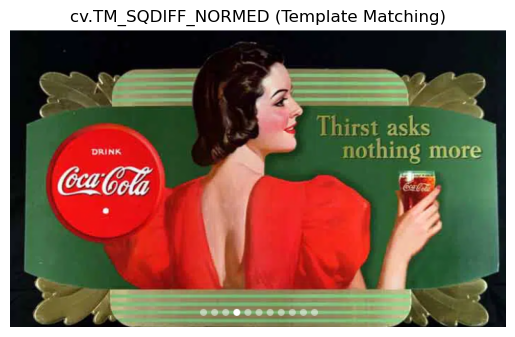

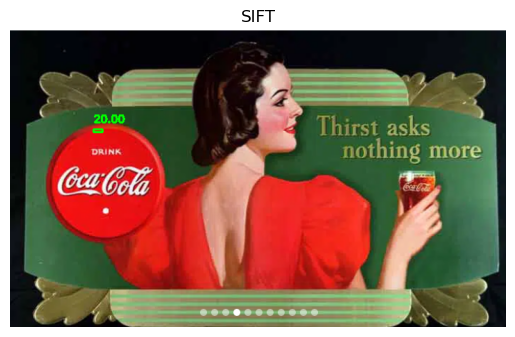

In [92]:
threshold = 0.5

# detectar logotipos usando SIFT
def detect_logo_with_sift(image, template):
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    gray_template = template.copy()

    sift = cv.SIFT_create()

    # Encontrar keypoints y descriptores en la imagen y el template
    kp_image, desc_image = sift.detectAndCompute(gray_image, None)
    kp_template, desc_template = sift.detectAndCompute(gray_template, None)

    # objeto de coincidencia de fuerza bruta usando los descriptores
    bf = cv.BFMatcher()
    matches = bf.knnMatch(desc_image, desc_template, k=2)

    # ratio test para obtener buenos matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    img_matches = cv.drawMatches(image, kp_image, template, kp_template, good_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # bounding box basado en los matches
    if len(good_matches) > 10:
        src_pts = np.float32([kp_image[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_template[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        H, _ = cv.findHomography(src_pts, dst_pts, cv.RANSAC, 5.0)
        h, w = template.shape
        pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)
        dst = cv.perspectiveTransform(pts, H)
        bbox = cv.boundingRect(dst)
        confidence = len(good_matches)

        return [(bbox[0], bbox[1], bbox[2], bbox[3])], confidence
    else:
        return [], 0.0

# Métodos de template matching a probar
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
           'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
           
for image_name in os.listdir(images_path):
    image_path = os.path.join(images_path, image_name)
    image = cv.imread(image_path)

    # template matching con pirámide gaussiana
    results_template = detect_multiple_logos_with_methods(image, template, methods)
    for method_name, (bboxes, confidences) in results_template.items():
        show_image_with_bboxes(image.copy(), bboxes, confidences, method_name + " (Template Matching)")

    # usando SIFT
    bboxes_sift, confidence_sift = detect_logo_with_sift(image, template)
    if confidence_sift > 0:
        show_image_with_bboxes(image.copy(), bboxes_sift, [confidence_sift], "SIFT")



#### Caso para coca_multi

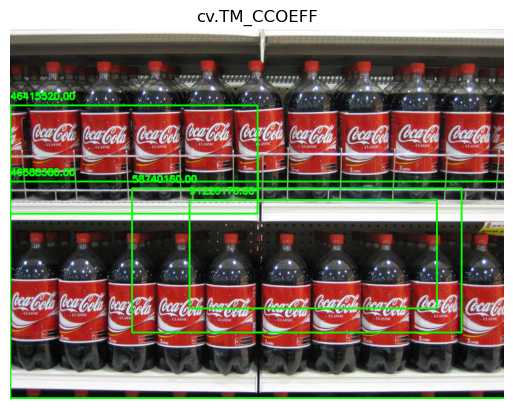

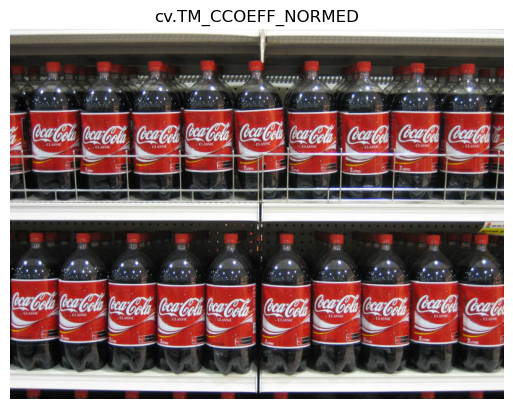

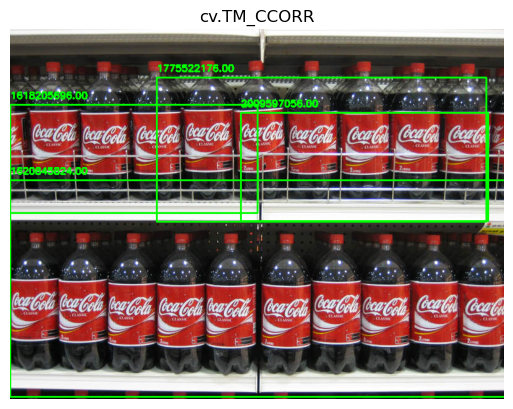

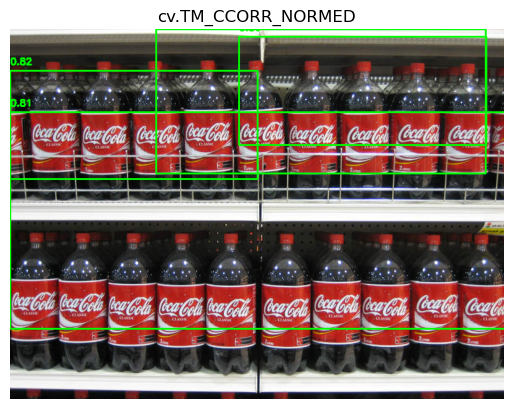

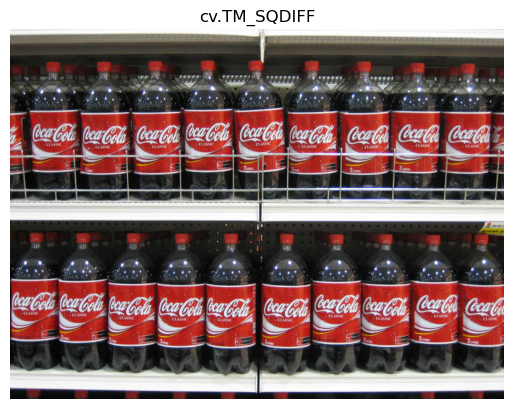

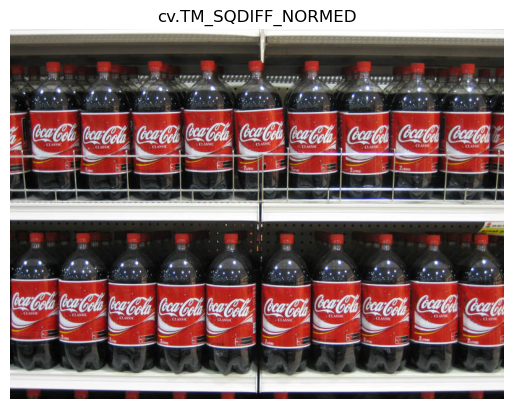

In [94]:
image_path = 'images/coca_multi.png' 
image = cv.imread(image_path)

h, w = template.shape
threshold = 0.8
# Procesar la imagen con múltiples métodos de template matching
results = detect_multiple_logos_with_methods(image, template, methods, confidence_threshold=threshold)

for method_name, (bboxes, confidences) in results.items():
    show_image_with_bboxes(image.copy(), bboxes, confidences, method_name)
